### EDA and Data Visualization
---

In [28]:
import warnings
import joblib
import gensim
import pandas as pd
import numpy as np
import pyLDAvis
import matplotlib.pyplot as plt 
import seaborn as sns
import json
import tqdm
import gensim.corpora as corpora
import pyLDAvis.gensim_models as gensimvis
import matplotlib.dates as mdates

from textblob import TextBlob
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from gensim.utils import simple_preprocess
from wordcloud import WordCloud, STOPWORDS
from gensim.models import CoherenceModel
from datetime import datetime

warnings.filterwarnings(action="ignore")
pyLDAvis.enable_notebook()

In [29]:
plt.style.available

['Solarize_Light2',
 '_classic_test_patch',
 'bmh',
 'classic',
 'dark_background',
 'fast',
 'fivethirtyeight',
 'ggplot',
 'grayscale',
 'seaborn',
 'seaborn-bright',
 'seaborn-colorblind',
 'seaborn-dark',
 'seaborn-dark-palette',
 'seaborn-darkgrid',
 'seaborn-deep',
 'seaborn-muted',
 'seaborn-notebook',
 'seaborn-paper',
 'seaborn-pastel',
 'seaborn-poster',
 'seaborn-talk',
 'seaborn-ticks',
 'seaborn-white',
 'seaborn-whitegrid',
 'tableau-colorblind10']

In [30]:
plt.style.use('seaborn-talk')

In [31]:
gcash_color = ['#1470cc', '#3399ff' , '#007dfe', 'lightgray', '#70b8ff']
paymaya_color = ['#92c83e', '#b4e36b', '#9bbf63', '#5d8a15', '#5c7535']

#### Topics per Month

In [32]:
models = joblib.load('../../Topic Modeling/Mico/Models/Model_2021_06_24-08-17-04_PM')

In [33]:
gcash_good_as_final, gcash_bad_as_final, gcash_good_ps_final, gcash_bad_ps_final = models[0], models[1], models[2], models[3]
paymaya_good_as_final, paymaya_bad_as_final, paymaya_good_ps_final, paymaya_bad_ps_final = models[4], models[5], models[6], models[7]

In [34]:
gcash_df_eda = joblib.load('../../Topic Modeling/Mico/Results/Labeled/gcash_df_eda.sav')
paymaya_df_eda = joblib.load('../../Topic Modeling/Mico/Results/Labeled/paymaya_df_eda.sav')

In [35]:
gcash_good_as_df, gcash_bad_as_df, gcash_good_ps_df, gcash_bad_ps_df = gcash_df_eda[0], gcash_df_eda[1], gcash_df_eda[2], gcash_df_eda[3]
paymaya_good_as_df, paymaya_bad_as_df, paymaya_good_ps_df, paymaya_bad_ps_df = paymaya_df_eda[0], paymaya_df_eda[1], paymaya_df_eda[2], paymaya_df_eda[3]

In [36]:
gcash_good_as_topics = ['Convenience (General)', 'Transaction Related', 'App Products', 'Convenience (Bank Transfer)']
gcash_bad_as_topics = ['Customer Service', 'Verification', 'Product Related', 'Transaction Related', 'App Issues']
gcash_good_ps_topics = ['Positive Feedback', 'App Products/Services', 'Transaction Related', 'Ease of Use', 'Convenience']
gcash_bad_ps_topics = ['Product Related', 'Account Related', 'Transaction Related', 'Customer Service', 'Verification']
paymaya_good_as_topics = ['Ease of Use', 'Convenience', 'Transaction Related', 'Customer Support Related']
paymaya_bad_as_topics = ['Account Related', 'Customer Service', 'Transaction Related']
paymaya_good_ps_topics = ['Convenience', 'General', 'Reliability', 'Transaction Related', 'App Features']
paymaya_bad_ps_topics = ['Customer Service', 'Account Related', 'Transaction Related', 'Account Upgrade', 'Feature Related']

In [37]:
def topic_wordcloud(model, title, topic_list):
    
    def color_func(word=None, font_size=None, position=None,  orientation=None, font_path=None, random_state=None):
        if 'GCash' in title:
            h = int(210)
        else:
            h = int(83)
        s = int(100.0 * 255.0 / 255.0)
        l = int(100.0 * float(random_state.randint(60, 120)) / 255.0)

        return "hsl({}, {}%, {}%)".format(h, s, l)
    
    num_topics = model.num_topics
    fig = plt.figure(figsize =(40,20))

    if title != 'GCash Play Store Good Reviews':
        for i in range(num_topics):
            ax = fig.add_subplot(1, num_topics, i+1)
            wordcloud = WordCloud(width = 400, 
                                  height = 400, 
                                  background_color ='white', 
                                  min_font_size = 10,
                                  color_func=color_func).fit_words(dict(model.show_topic(i, 200)))
            ax.imshow(wordcloud)
            ax.axis('off')
            ax.title.set_text(topic_list[i])        
    else:
        for i in range(1, num_topics):
            ax = fig.add_subplot(1, num_topics, i+1)
            wordcloud = WordCloud(width = 400, 
                                  height = 400, 
                                  background_color ='white', 
                                  min_font_size = 10,
                                  color_func=color_func).fit_words(dict(model.show_topic(i, 200)))
            ax.imshow(wordcloud)
            ax.axis('off')
            ax.title.set_text(topic_list[i])        

    fig.show()

    # Save figure
    fig.savefig(f'Results/Figures/Topic/{title}_wordcloud.png')

In [76]:
def topic_plotter(df, title, color):
    # For line graph
    df1 = df.rename(columns = {'date':'Month'}, inplace= False)
    df1 = df1.set_index('Month')
    group = df1.groupby([pd.Grouper(freq='M'), 'Topic']).count().unstack(fill_value=0).stack()
    group = group.reset_index()
    group = group.pivot(index = 'Month', columns='Topic', values='title_review_tokenized')
    
    if "Positive Feedback" in group:
        group = group.drop(['Positive Feedback'], axis = 1)
    
    group['Sum'] = group.sum(axis=1)
    for column in group:
        if column != 'Sum':
            group[column] = (group[column]/group['Sum'])*100
            
    group=group.drop(['Sum'], axis = 1)

    # For bar plot
    df2 = df[['Topic', 'title_review_tokenized']]
    df2 = df.rename(columns = {'title_review_tokenized':'Topics'}, inplace= False)
    df2 = df2.groupby('Topic').count()
    
    if "Positive Feedback" in df2.index:
        df2 = df2.drop("Positive Feedback")
    
    ax = group.plot(title = f'{title} Distribution per Month',  
               kind='bar',
               stacked=True,
               color=color)
    ax.spines["left"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.spines["top"].set_visible(False)
    ax.legend(bbox_to_anchor= (1.05, 0.2))
    ax.set_xticklabels([x.strftime("%b %Y") for x in group.index], rotation=45)
    
    # Save figure
    fig = ax.get_figure()
    fig.savefig(f'Results/Figures/Topic/{title}_v2.png', bbox_inches='tight')

In [41]:
def topic_plotter(df, title, color):
    # For line graph
    df1 = df.rename(columns = {'date':'Month'}, inplace= False)
    df1 = df1.set_index('Month')
    group = df1.groupby([pd.Grouper(freq='M'), 'Topic']).count().unstack(fill_value=0).stack()
    group = group.reset_index()
    group = group.pivot(index = 'Month', columns='Topic', values='title_review_tokenized')
    
    if "Positive Feedback" in group:
        group = group.drop(['Positive Feedback'], axis = 1)
    
    group['Sum'] = group.sum(axis=1)
    for column in group:
        if column != 'Sum':
            group[column] = (group[column]/group['Sum'])*100
            
    group=group.drop(['Sum'], axis = 1)

    # For bar plot
    df2 = df[['Topic', 'title_review_tokenized']]
    df2 = df.rename(columns = {'title_review_tokenized':'Topics'}, inplace= False)
    df2 = df2.groupby('Topic').count()
    
    if "Positive Feedback" in df2.index:
        df2 = df2.drop("Positive Feedback")
    
    fig, axes = plt.subplots(1,2, figsize=(25,10))

    ax = group.plot(title = f'{title} Distribution per Month',  
               kind='bar',
               stacked=True,
               color=color,
               ax = axes[0])
    ax.spines["left"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.spines["top"].set_visible(False)
    ax.legend(bbox_to_anchor= (1, 0.2))
    ax.set_xticklabels([x.strftime("%b %Y") for x in group.index], rotation=45)
    
    axes[1] = plt.pie(df2.Topics, 
                      labels=df2.index, 
                      colors=color, 
                      autopct='%1.1f%%')
    central_circle = plt.Circle((0, 0), 0.75, color='white')
    fig.gca().add_artist(central_circle)
    plt.rc('font', size=15)
    plt.title(f'{title} Distribution')
    
    # Save figure
    fig.savefig(f'Results/Figures/Topic/{title}.png')

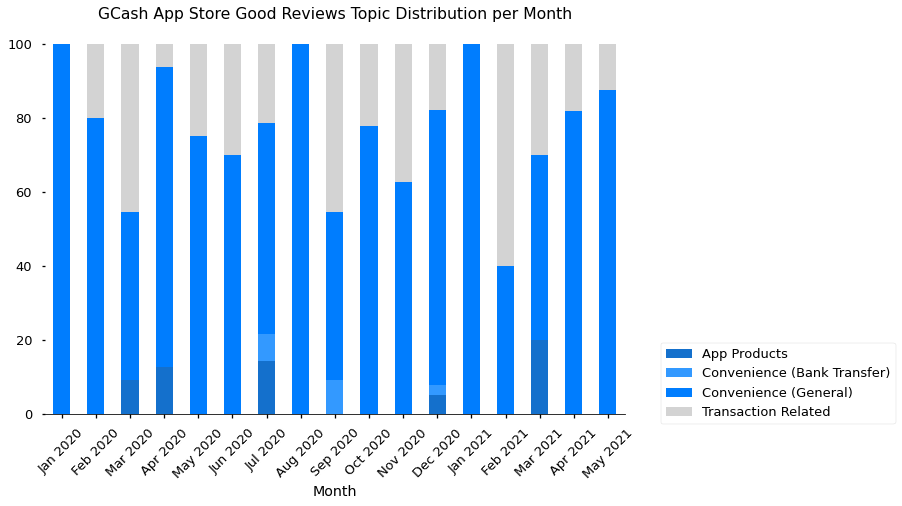

In [77]:
topic_plotter(gcash_good_as_df, 'GCash App Store Good Reviews Topic', gcash_color)

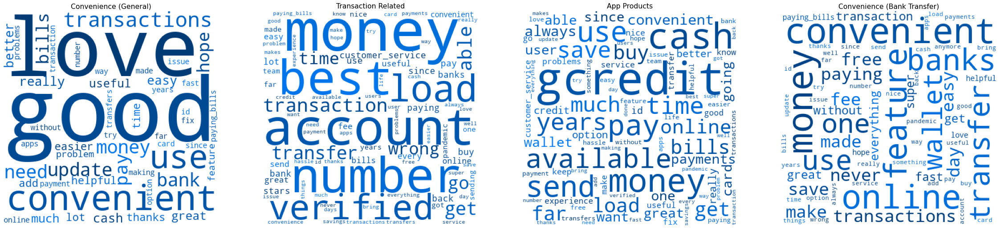

In [413]:
topic_wordcloud(gcash_good_as_final, 'GCash App Store Good Reviews', gcash_good_as_topics)

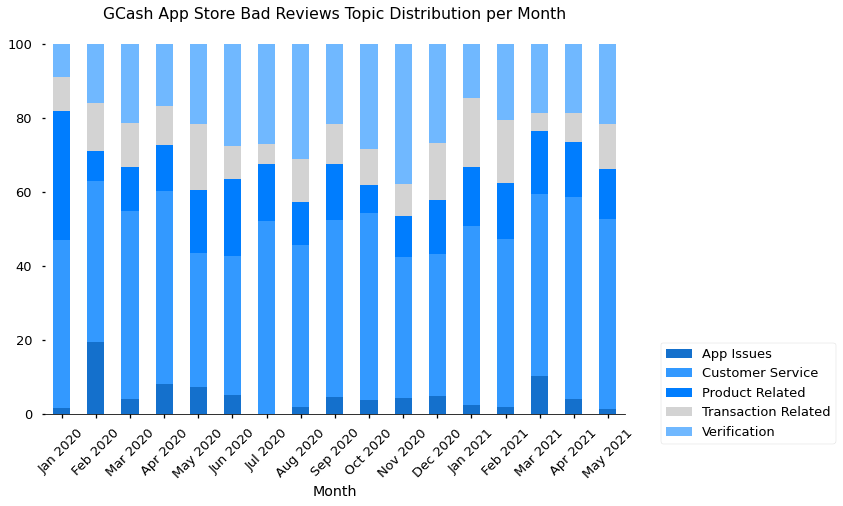

In [78]:
topic_plotter(gcash_bad_as_df, 'GCash App Store Bad Reviews Topic', gcash_color)

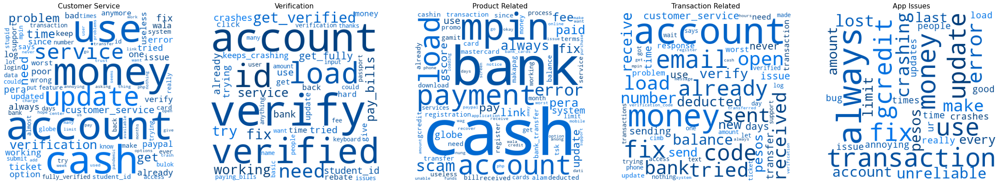

In [415]:
topic_wordcloud(gcash_bad_as_final, 'GCash App Store Bad Reviews', gcash_bad_as_topics)

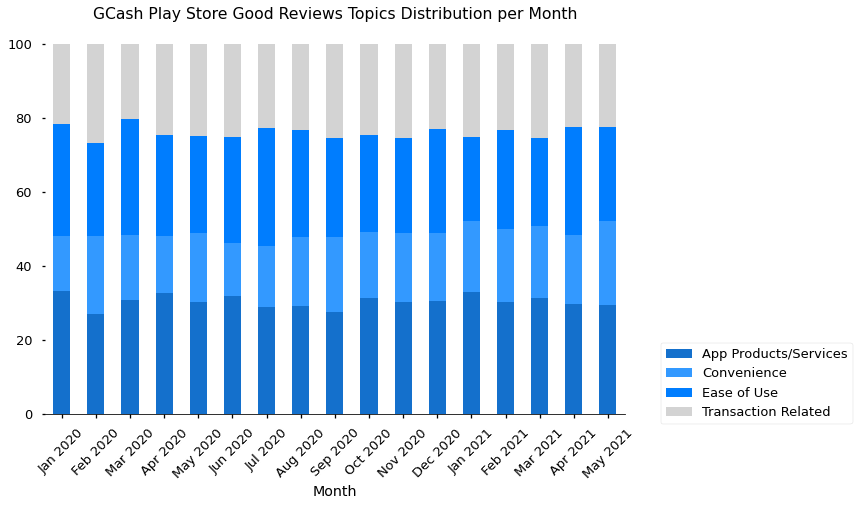

In [79]:
topic_plotter(gcash_good_ps_df, 'GCash Play Store Good Reviews Topics', gcash_color)

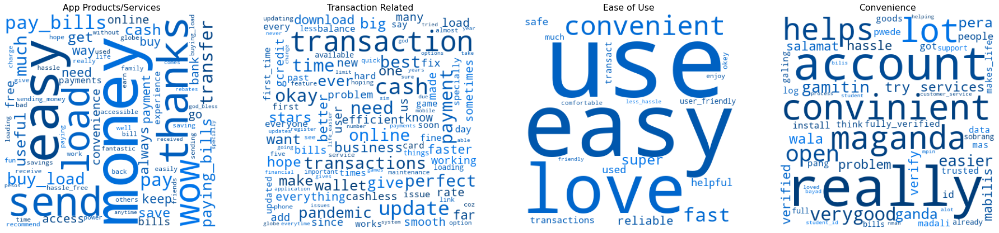

In [417]:
topic_wordcloud(gcash_good_ps_final, 'GCash Play Store Good Reviews', gcash_good_ps_topics)

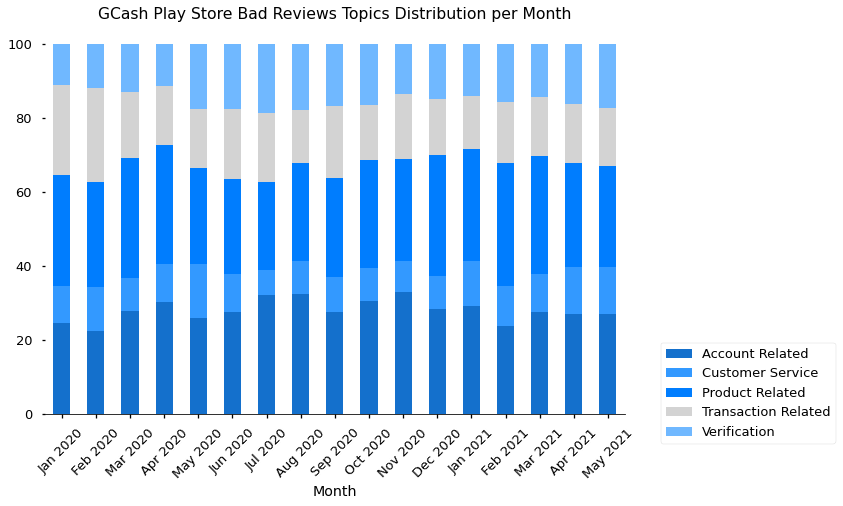

In [80]:
topic_plotter(gcash_bad_ps_df, 'GCash Play Store Bad Reviews Topics', gcash_color)

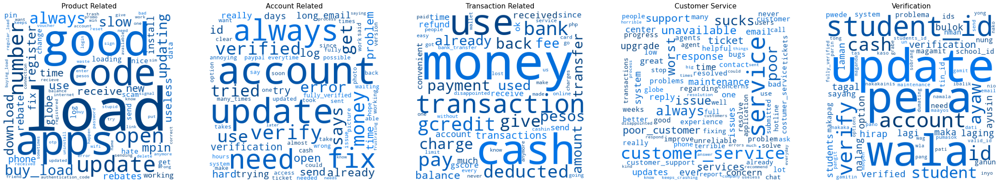

In [12]:
topic_wordcloud(gcash_bad_ps_final, 'GCash Play Store Bad Reviews', gcash_bad_ps_topics)

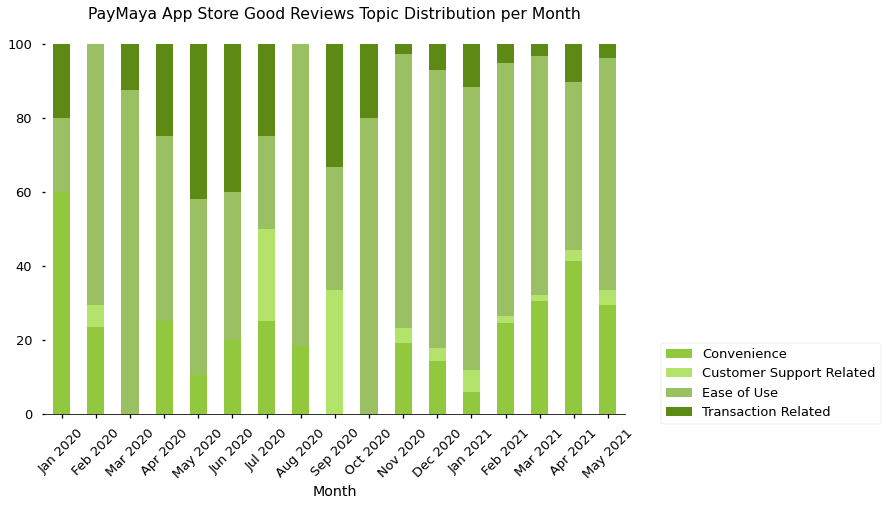

In [81]:
topic_plotter(paymaya_good_as_df, 'PayMaya App Store Good Reviews Topic', paymaya_color)

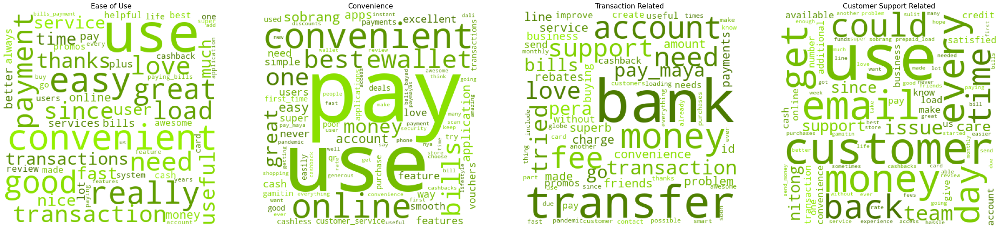

In [421]:
topic_wordcloud(paymaya_good_as_final, 'PayMaya App Store Good Reviews', paymaya_good_as_topics)

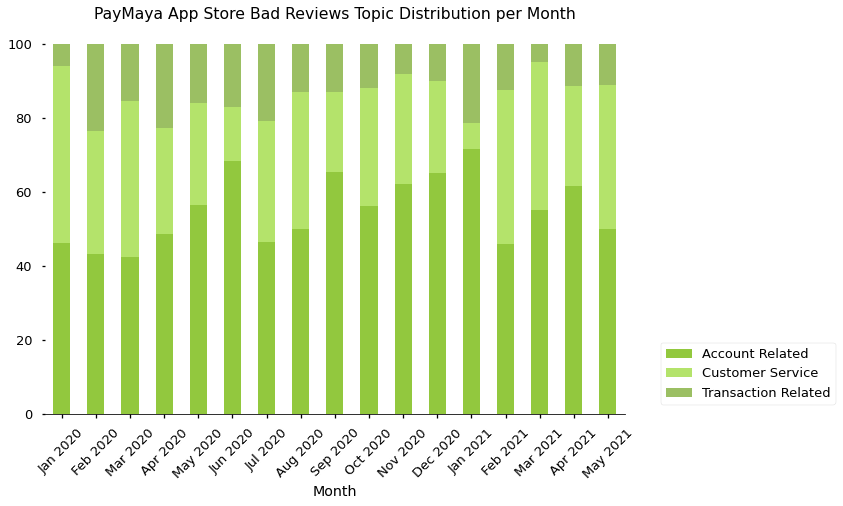

In [82]:
topic_plotter(paymaya_bad_as_df, 'PayMaya App Store Bad Reviews Topic', paymaya_color)

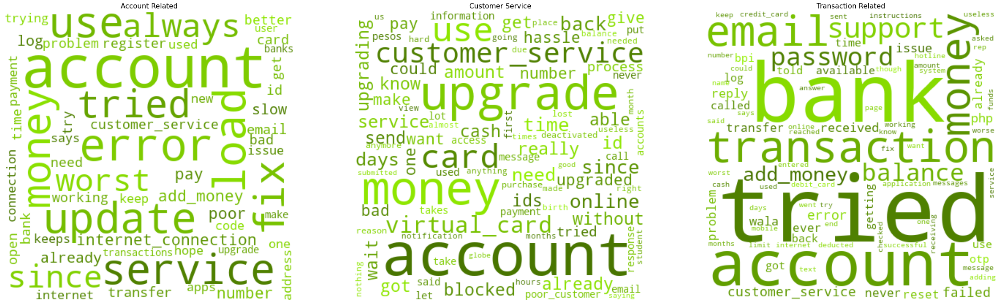

In [423]:
topic_wordcloud(paymaya_bad_as_final, 'PayMaya App Store Bad Reviews', paymaya_bad_as_topics)

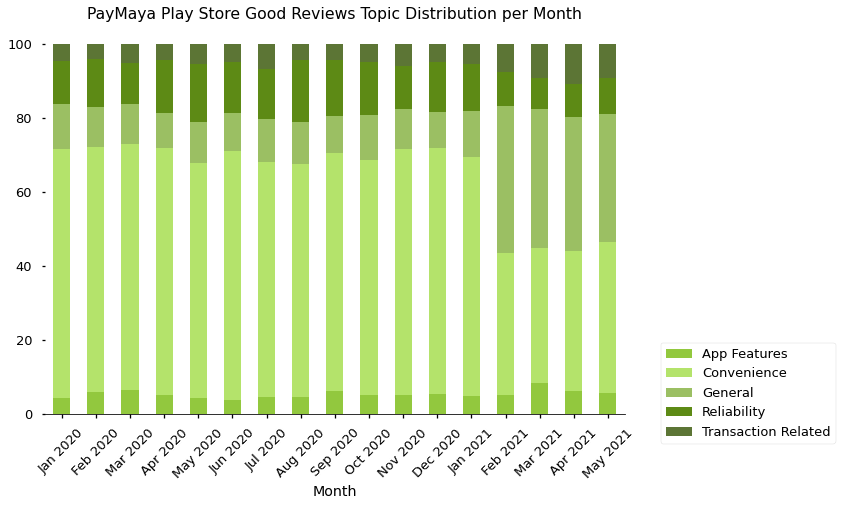

In [83]:
topic_plotter(paymaya_good_ps_df, 'PayMaya Play Store Good Reviews Topic', paymaya_color)

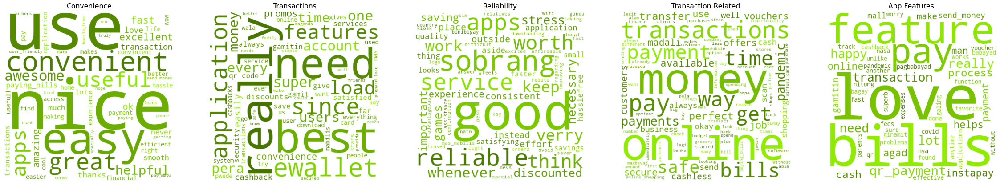

In [425]:
topic_wordcloud(paymaya_good_ps_final, 'PayMaya Play Store Good Reviews', paymaya_good_ps_topics)

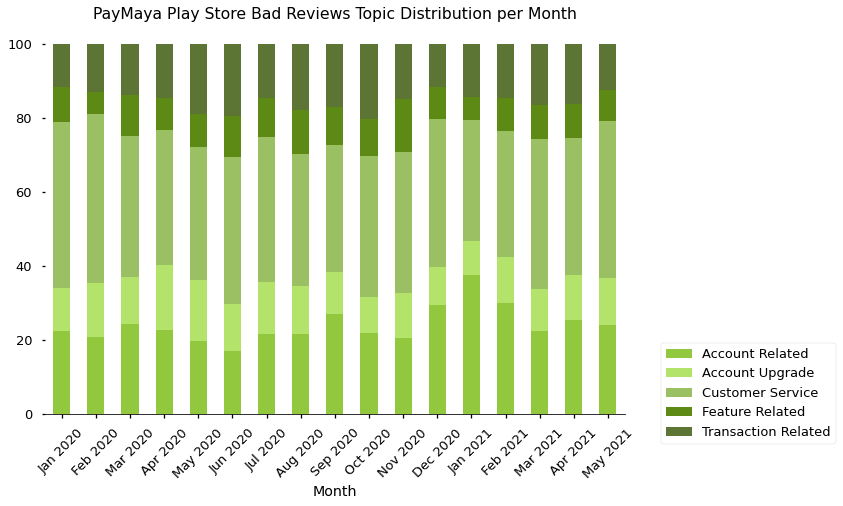

In [84]:
topic_plotter(paymaya_bad_ps_df, 'PayMaya Play Store Bad Reviews Topic', paymaya_color)

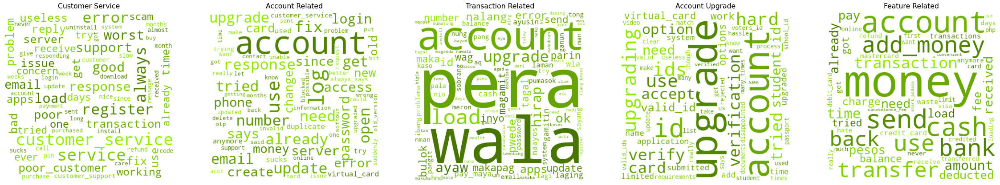

In [427]:
topic_wordcloud(paymaya_bad_ps_final, 'PayMaya Play Store Bad Reviews', paymaya_bad_ps_topics)

#### Gauging the Competition: How often is PayMaya mentioned in the reviews and in what light?

---

#### A. Check Percentage Competitor is Mentioned in Reviews

In [6]:
gcash_df = joblib.load('../../Data/Preprocessed/Mico/EDA/gcash_df.sav')
gcash_good_as_df, gcash_bad_as_df, gcash_good_ps_df, gcash_bad_ps_df = gcash_df[0], gcash_df[1], gcash_df[2], gcash_df[3]

In [7]:
paymaya_df = joblib.load('../../Data/Preprocessed/Mico/EDA/paymaya_df.sav')
paymaya_good_as_df, paymaya_bad_as_df, paymaya_good_ps_df, paymaya_bad_ps_df = paymaya_df[0], paymaya_df[1], paymaya_df[2], paymaya_df[3]

In [8]:
gcash_good = pd.concat([gcash_good_as_df, gcash_good_ps_df])
paymaya_good = pd.concat([paymaya_good_as_df, paymaya_good_ps_df])

In [9]:
gcash_bad = pd.concat([gcash_bad_as_df, gcash_bad_ps_df])
paymaya_bad = pd.concat([paymaya_bad_as_df, paymaya_bad_ps_df])

In [10]:
def find_instances(df, term_list):
    reviews = []
    date = []
    
    for term in term_list:
        for index in df.index:
            if term in df.at[index, 'title_review']:
                reviews.append(df.at[index, 'title_review'])
                date.append(df.at[index, 'date'])
                
    return reviews, date

In [11]:
paymaya_list = ['paymaya']
gcash_list = ['gcash']

In [12]:
gcash_good_reviews, gcash_good_date = find_instances(gcash_good, paymaya_list)
gcash_bad_reviews, gcash_bad_date = find_instances(gcash_bad, paymaya_list)
gcash_good_reviews_df = pd.DataFrame(list(zip(gcash_good_reviews, gcash_good_date)), columns = ['Reviews', 'Date'])
gcash_bad_reviews_df = pd.DataFrame(list(zip(gcash_bad_reviews, gcash_bad_date)), columns = ['Reviews', 'Date'])

In [13]:
paymaya_good_reviews, paymaya_good_date = find_instances(paymaya_good, gcash_list)
paymaya_bad_reviews, paymaya_bad_date = find_instances(paymaya_bad, gcash_list)
paymaya_good_reviews_df = pd.DataFrame(list(zip(paymaya_good_reviews, paymaya_good_date)), columns = ['Reviews', 'Date'])
paymaya_bad_reviews_df = pd.DataFrame(list(zip(paymaya_bad_reviews, paymaya_bad_date)), columns = ['Reviews', 'Date'])

In [22]:
len(paymaya_bad)

14668

In [33]:
def instance_plot(good_reviews, bad_reviews, total_good, total_bad, title, color):
    data = {'Percentage': [(len(good_reviews)/len(total_good))*100, (len(bad_reviews)/len(total_bad))*100]}
    df_counts = pd.DataFrame(data, index = ['Good Reviews', 'Bad Reviews'])

    fig, axes = plt.subplots(1,2, figsize=(30,10))
    if 'GCash' in title:
        new_title = f"Percentage PayMaya is Mentioned in GCash Reviews"
    else:
        new_title = f"Percentage GCash is Mentioned in PayMaya Reviews"
        
    ax = df_counts.plot(kind = 'bar', ax = axes[0], title = new_title, color = color)
    ax.spines["left"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.spines["top"].set_visible(False)
    ax.get_legend().remove()
    
    for p in axes[0].patches:
        axes[0].annotate('{:.3}'.format(float(str(p.get_height()))), (p.get_x() * 1.005, p.get_height() * 1.005))
    
    def absolute_value(val):
        a  = np.round(val/100.*(len(good_reviews)+len(bad_reviews)), 0)
        return a

    data = {'Count': [len(good_reviews), len(bad_reviews)]}
    df_counts = pd.DataFrame(data, index = ['Good Reviews', 'Bad Reviews'])
    
    # Donut Chart
    axes[1] = plt.pie(df_counts.Count, 
                      labels=df_counts.index, 
                      colors=color, 
                      autopct='%1.1f%%')
    central_circle = plt.Circle((0, 0), 0.75, color='white')
    fig.gca().add_artist(central_circle)
    plt.rc('font', size=15)
    if 'GCash' in title:
        plt.title(f'Distribution of Reviews where PayMaya is Mentioned')
    else:
        plt.title(f'Distribution of Reviews where GCash is Mentioned')
    
    # Save figure
    fig.savefig(f'Results/Figures/Instance/{title} Percentage.png')

In [34]:
def instance_plot_month(df_good, df_bad, df_good_all, df_bad_all, title, color):     
    fig, axes = plt.subplots(1,2, figsize=(30,10))
    
    # Group by month to get total good reviews per month
    df1 = df_good_all.rename(columns = {'date':'Month'}, inplace = False)
    df1 = df1.set_index('Month')
    df1 = df1[['rating']]
    group1 = df1.groupby([pd.Grouper(freq='M')]).count()
    
    # Group by month to get total good reviews with mentions of competitor
    df2 = df_good.rename(columns = {'Date':'Month'}, inplace = False)
    df2 = df2.set_index('Month')
    group2 = df2.groupby([pd.Grouper(freq='M')]).count()
    group2['Reviews'] = group2['Reviews'].astype(int)
    group2['Percentage'] = (group2['Reviews']/group1['rating']) * 100
    group2 = group2['Percentage']
    
    if 'GCash' in title:
        new_title = "Percentage PayMaya is Mentioned in GCash Good Reviews per Month"
    else:
        new_title = "Percentage GCash is Mentioned in PayMaya Good Reviews per Month"
        
    ax = group2.plot(title = new_title,  
                    color=color,
                     kind='bar',
                    ax = axes[0])
    ax.spines["left"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.spines["top"].set_visible(False)
    ax.set_xticklabels([x.strftime("%b %Y") for x in group2.index], rotation=45)
    
    df3 = df_bad_all.rename(columns = {'date':'Month'}, inplace = False)
    df3 = df3.set_index('Month')
    df3 = df3[['rating']]
    group3 = df3.groupby([pd.Grouper(freq='M')]).count()
    
    df4 = df_bad.rename(columns = {'Date':'Month'}, inplace = False)
    df4 = df4.set_index('Month')
    group4 = df4.groupby([pd.Grouper(freq='M')]).count()
    group4['Reviews'] = group4['Reviews'].astype(int)
    group4['Percentage'] = (group4['Reviews']/group3['rating']) * 100
    group4 = group4['Percentage']
    
    if 'GCash' in title:
        new_title = "Percentage PayMaya is Mentioned in GCash Bad Reviews per Month"
    else:
        new_title = "Percentage GCash is Mentioned in PayMaya Bad Reviews per Month"
        
    ax = group4.plot(title = new_title,  
                    color=color,
                     kind='bar',
                    ax = axes[1])
    ax.spines["left"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.spines["top"].set_visible(False)
    ax.set_xticklabels([x.strftime("%b %Y") for x in group2.index], rotation=45)
    
    # Save figure
    fig.savefig(f'Results/Figures/Instance/{title} Per Month.png')

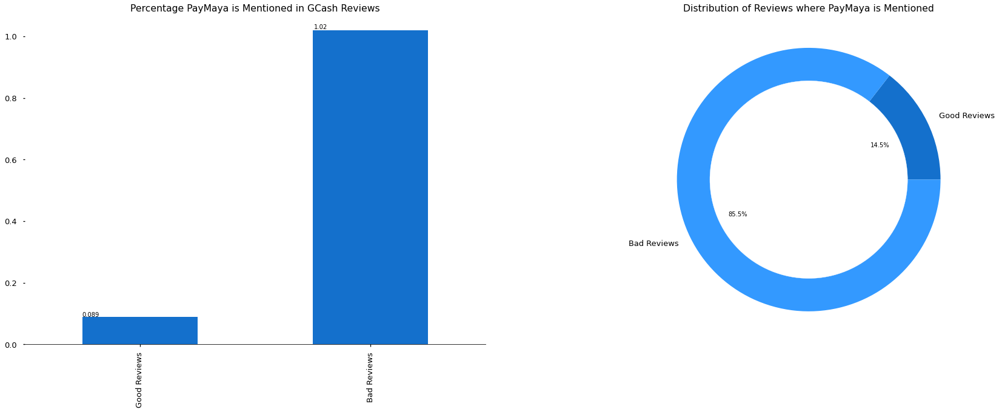

In [35]:
instance_plot(gcash_good_reviews, gcash_bad_reviews, gcash_good, gcash_bad, 'GCash', color = gcash_color)

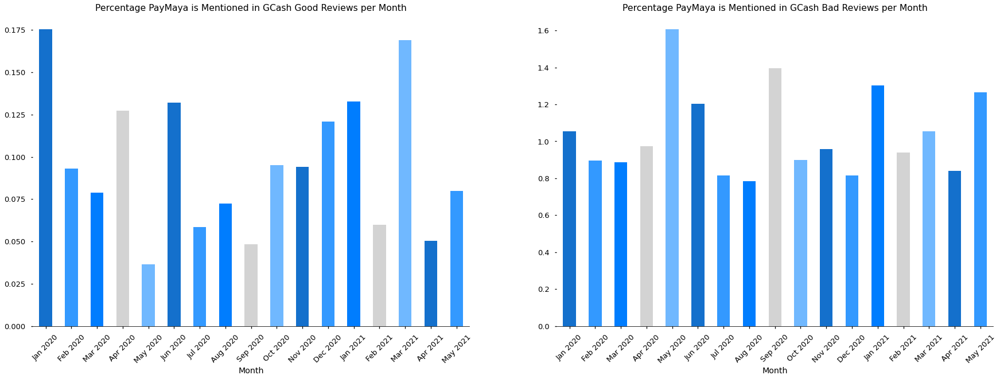

In [36]:
instance_plot_month(gcash_good_reviews_df, gcash_bad_reviews_df, gcash_good, gcash_bad, 'GCash', gcash_color)

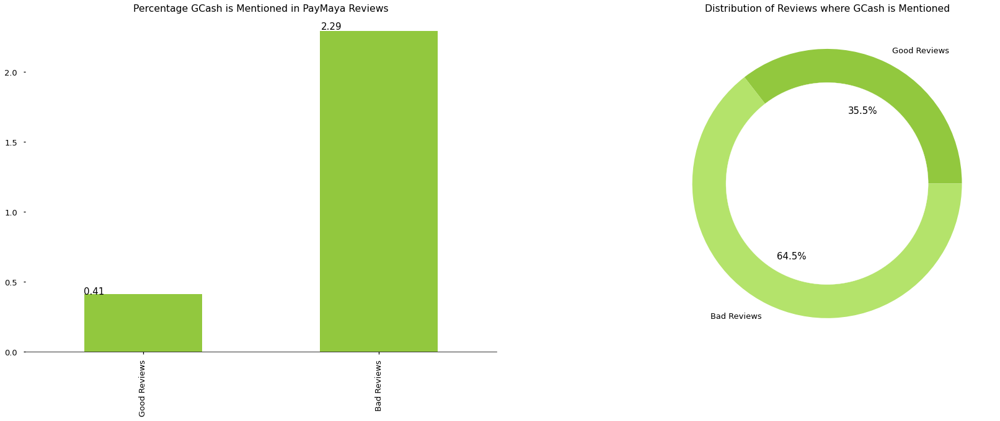

In [37]:
instance_plot(paymaya_good_reviews, paymaya_bad_reviews, paymaya_good, paymaya_bad,'PayMaya', paymaya_color)

In [38]:
paymaya_good_reviews_df['Date']= pd.to_datetime(paymaya_good_reviews_df['Date'], utc=True)
paymaya_bad_reviews_df['Date']= pd.to_datetime(paymaya_bad_reviews_df['Date'], utc=True)

In [39]:
paymaya_good['date']= pd.to_datetime(paymaya_good['date'], utc=True)
paymaya_bad['date']= pd.to_datetime(paymaya_bad['date'], utc=True)

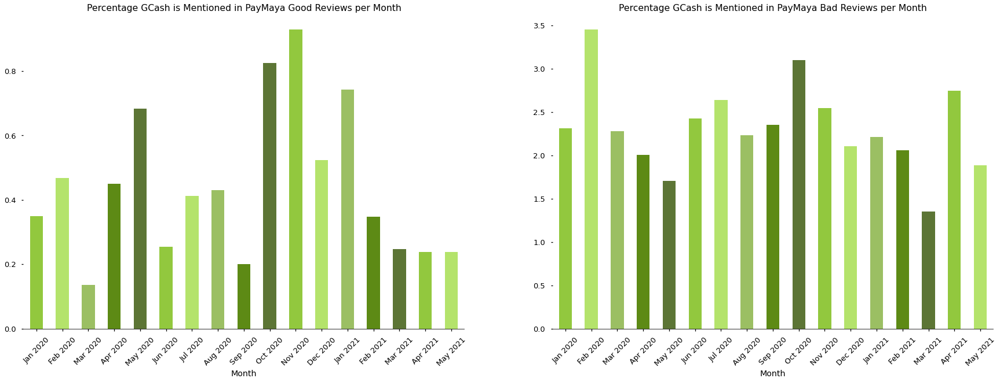

In [40]:
instance_plot_month(paymaya_good_reviews_df, paymaya_bad_reviews_df,paymaya_good, paymaya_bad, 'PayMaya', paymaya_color)

In [41]:
with open('../../Data/Stopwords/stopwords-custom.json') as file:
    custom_stopwords = json.load(file)

In [42]:
with open('../../Data/Stopwords/stopwords-tl.json') as file:
    tl_stopwords = json.load(file)

In [43]:
taglish_stopwords = stopwords.words('english')
taglish_stopwords.extend(tl_stopwords)
taglish_stopwords.extend(custom_stopwords)

#### B. Create Wordclouds

In [44]:
def preprocess(review_list):
    tokenized = [word_tokenize(entry) for entry in review_list] # Tokenization
    tokenized = [[word for word in simple_preprocess(str(doc)) if word not in taglish_stopwords] for doc in tokenized]
    
    converted = ''
    
    for i in range(0, len(tokenized)):
        converted += " ".join(tokenized[i])+" "
        
    return tokenized, converted

In [45]:
gcash_good_reviews_tokenized, gcash_good_reviews_converted = preprocess(gcash_good_reviews)
gcash_bad_reviews_tokenized, gcash_bad_reviews_converted = preprocess(gcash_bad_reviews)
paymaya_good_reviews_tokenized, paymaya_good_reviews_converted = preprocess(paymaya_good_reviews)
paymaya_bad_reviews_tokenized, paymaya_bad_reviews_converted = preprocess(paymaya_bad_reviews)

#### C. Topic Modeling

In [46]:
def data_transform(data):
    id2word = corpora.Dictionary(data)
    id2word.filter_extremes(no_below = 5, no_above = 0.5, keep_n=100000)
    texts = data
    corpus = [id2word.doc2bow(text) for text in texts]
    
    return id2word, corpus

In [47]:
gcash_good_reviews_dict, gcash_good_reviews_corpus = data_transform(gcash_good_reviews_tokenized)
gcash_bad_reviews_dict, gcash_bad_reviews_corpus = data_transform(gcash_bad_reviews_tokenized)

In [48]:
paymaya_good_reviews_dict, paymaya_good_reviews_corpus = data_transform(paymaya_good_reviews_tokenized)
paymaya_bad_reviews_dict, paymaya_bad_reviews_corpus = data_transform(paymaya_bad_reviews_tokenized)

In [49]:
# supporting function
def compute_coherence_values(corpus, dictionary, data, k, a, b):
    
    lda_model = gensim.models.LdaMulticore(corpus=corpus,
                                           id2word=dictionary,
                                           num_topics=k,
                                           random_state=100,
                                           chunksize=10000,
                                           passes=10,
                                           alpha=a,
                                           eta=b)
    
    coherence_model_lda = CoherenceModel(model=lda_model, texts=data, dictionary=dictionary, coherence='c_v')
    
    return coherence_model_lda.get_coherence()

In [50]:
def hyperparameter_tuner(corpus, dictionary, data, temp):
    grid = {}
    grid['Validation_Set'] = {}

    # Topics range
    min_topics = 3
    max_topics = 6
    step_size = 1
    topics_range = range(min_topics, max_topics, step_size)

    # Alpha parameter
    alpha = list(np.arange(0.01, 1, 0.3))
    alpha.append('symmetric')
    alpha.append('asymmetric')

    # Beta parameter
    beta = list(np.arange(0.01, 1, 0.3))
    beta.append('symmetric')

    # Validation sets
    num_of_docs = len(corpus)
    corpus_sets = [corpus]
    corpus_title = ['100% Corpus']
    model_results = {'Validation_Set': [],
                     'Topics': [],
                     'Alpha': [],
                     'Beta': [],
                     'Coherence': []
                    }

    # Can take a long time to run
    if 1 == 1:
        pbar = tqdm.tqdm(total=90)

        # iterate through validation corpuses
        for i in range(len(corpus_sets)):
            # iterate through number of topics
            for k in topics_range:
                # iterate through alpha values
                for a in alpha:
                    # iterare through beta values
                    for b in beta:
                        # get the coherence score for the given parameters
                        cv = compute_coherence_values(corpus_sets[i], 
                                                      dictionary, 
                                                      data,
                                                      k, a, b)
                        # Save the model results
                        model_results['Validation_Set'].append(corpus_title[i])
                        model_results['Topics'].append(k)
                        model_results['Alpha'].append(a)
                        model_results['Beta'].append(b)
                        model_results['Coherence'].append(cv)

                        pbar.update(1)
        filename = f'Results/Hyperparameter/{temp}.csv'
        pd.DataFrame(model_results).to_csv(filename, index=False)
        pbar.close()

In [51]:
hyperparameter_tuner(gcash_good_reviews_corpus, gcash_good_reviews_dict, gcash_good_reviews_tokenized, 'gcash_good')

100%|██████████| 90/90 [04:16<00:00,  2.85s/it]


In [52]:
hyperparameter_tuner(gcash_bad_reviews_corpus, gcash_bad_reviews_dict, gcash_bad_reviews_tokenized, 'gcash_bad')

100%|██████████| 90/90 [07:59<00:00,  5.32s/it]


In [53]:
hyperparameter_tuner(paymaya_good_reviews_corpus, paymaya_good_reviews_dict, paymaya_good_reviews_tokenized, 'paymaya_good')

100%|██████████| 90/90 [05:33<00:00,  3.71s/it]


In [54]:
hyperparameter_tuner(paymaya_bad_reviews_corpus, paymaya_bad_reviews_dict, paymaya_bad_reviews_tokenized, 'paymaya_bad')

100%|██████████| 90/90 [07:12<00:00,  4.81s/it]


In [69]:
def build_final_model(df, corpus, dictionary, ntopics=0):
    df1 = df.iloc[df['Coherence'].idxmax]
    alpha = df1.Alpha
    beta = df1.Beta
    
    if ntopics != 0:
        topics = ntopics
    else:
        topics = df1.Topics
    
    if (alpha != 'symmetric') and (alpha != "asymmetric"):
        alpha = float(alpha)
        
    if (beta != 'symmetric'):
        beta = float(beta)
    
    lda_model = gensim.models.LdaMulticore(corpus=corpus,
                                           id2word=dictionary,
                                           num_topics=topics, 
                                           random_state=100,
                                           chunksize=100,
                                           passes=10,
                                           alpha=alpha,
                                           eta=beta)
    
    return lda_model

In [56]:
df_gcash_good = pd.read_csv('Results/Hyperparameter/gcash_good.csv')
df_gcash_bad = pd.read_csv('Results/Hyperparameter/gcash_bad.csv')
df_paymaya_good = pd.read_csv('Results/Hyperparameter/paymaya_good.csv')
df_paymaya_bad = pd.read_csv('Results/Hyperparameter/paymaya_bad.csv')

In [57]:
gcash_good_final = build_final_model(df_gcash_good, gcash_good_reviews_corpus, gcash_good_reviews_dict)
gcash_bad_final = build_final_model(df_gcash_bad, gcash_bad_reviews_corpus, gcash_bad_reviews_dict)

In [58]:
paymaya_good_final = build_final_model(df_paymaya_good, paymaya_good_reviews_corpus, paymaya_good_reviews_dict)
paymaya_bad_final = build_final_model(df_paymaya_bad, paymaya_bad_reviews_corpus, paymaya_bad_reviews_dict)

In [59]:
models = [gcash_good_final, gcash_bad_final, paymaya_good_final, paymaya_bad_final]

In [60]:
joblib.dump(models, f"Results/Models/Final Model.sav")

['Results/Models/Final Model.sav']

In [61]:
gcash_good_visual = gensimvis.prepare(gcash_good_final, gcash_good_reviews_corpus, gcash_good_reviews_dict)
print(gcash_good_final.print_topics())
gcash_good_visual

[(0, '0.077*"use" + 0.065*"better" + 0.050*"cash" + 0.039*"service" + 0.036*"card" + 0.036*"easy" + 0.036*"bank" + 0.036*"transfer" + 0.036*"account" + 0.032*"unlike"'), (1, '0.152*"transaction" + 0.098*"hope" + 0.082*"history" + 0.052*"money" + 0.050*"transactions" + 0.036*"send" + 0.036*"pay" + 0.035*"great" + 0.032*"user" + 0.031*"use"'), (2, '0.207*"update" + 0.047*"well" + 0.046*"online" + 0.045*"transaction" + 0.039*"history" + 0.035*"thanks" + 0.035*"card" + 0.035*"better" + 0.034*"one" + 0.023*"great"'), (3, '0.028*"better" + 0.028*"much" + 0.028*"account" + 0.028*"thanks" + 0.028*"good" + 0.028*"easy" + 0.028*"bank" + 0.028*"use" + 0.028*"customer" + 0.028*"one"')]


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
0      0.042628 -0.047610       1        1  69.295810
1     -0.080443 -0.002965       2        1  18.861497
2      0.031468  0.058518       3        1   9.272893
3      0.006347 -0.007943       4        1   2.569800, topic_info=           Term       Freq      Total Category  logprob  loglift
23       update   8.000000   8.000000  Default  30.0000  30.0000
6   transaction  13.000000  13.000000  Default  29.0000  29.0000
5          hope  11.000000  11.000000  Default  28.0000  28.0000
35      history   6.000000   6.000000  Default  27.0000  27.0000
19       online   8.000000   8.000000  Default  26.0000  26.0000
..          ...        ...        ...      ...      ...      ...
0        better   0.222996  15.990053   Topic4  -3.5823  -0.6112
2           use   0.222789  19.256710   Topic4  -3.5832  -0.7980
15         cash   0.222757  12.978160   Topic4  -3.5833  -0.4036
5          hope   0.222713  11.100937   Topic4  -3.5835  -0.2476
6   transaction   0.222645  13.596328   Topic4  -3.5838  -0.4506

[168 rows x 6 columns], token_table=      Topic      Freq     Term
term                          
7         1  0.874276  account
7         2  0.109284  account
7         3  0.109284  account
8         1  0.734908      add
8         2  0.146982      add
...     ...       ...      ...
27        1  0.536773     well
27        2  0.178924     well
27        3  0.178924     well
29        1  0.722019  without
29        2  0.120336  without

[89 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 2, 3, 4])

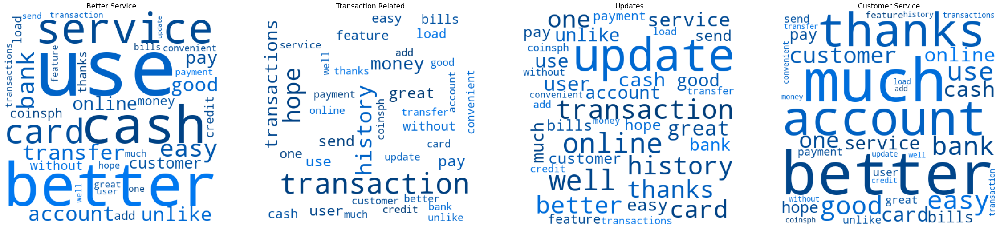

In [73]:
gcash_good_compare_topics = ['Better Service', 'Transaction Related', 'Updates', 'Customer Service']
topic_wordcloud(gcash_good_final, 'GCash Good Reviews', gcash_good_compare_topics)

In [63]:
gcash_bad_visual = gensimvis.prepare(gcash_bad_final, gcash_bad_reviews_corpus, gcash_bad_reviews_dict)
print(gcash_bad_final.print_topics())
gcash_bad_visual

[(0, '0.018*"charge" + 0.017*"load" + 0.017*"fee" + 0.015*"use" + 0.015*"cash" + 0.015*"money" + 0.015*"transfer" + 0.014*"need" + 0.013*"bank" + 0.012*"get"'), (1, '0.035*"money" + 0.022*"cash" + 0.019*"account" + 0.015*"pesos" + 0.015*"load" + 0.014*"use" + 0.013*"better" + 0.013*"much" + 0.011*"send" + 0.011*"nalang"'), (2, '0.041*"use" + 0.024*"better" + 0.023*"money" + 0.022*"time" + 0.018*"service" + 0.015*"transaction" + 0.015*"always" + 0.012*"load" + 0.011*"transfer" + 0.010*"account"'), (3, '0.032*"account" + 0.022*"transaction" + 0.014*"system" + 0.014*"service" + 0.014*"id" + 0.013*"always" + 0.012*"customer" + 0.012*"use" + 0.012*"verify" + 0.011*"mas"')]


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
2      0.001550 -0.057429       1        1  35.835751
0     -0.050414 -0.006669       2        1  24.491564
3      0.068202  0.011336       3        1  22.707507
1     -0.019338  0.052762       4        1  16.965179, topic_info=         Term       Freq      Total Category  logprob  loglift
18      money  92.000000  92.000000  Default  30.0000  30.0000
0     account  77.000000  77.000000  Default  29.0000  29.0000
209    charge  27.000000  27.000000  Default  28.0000  28.0000
287     pesos  17.000000  17.000000  Default  27.0000  27.0000
5        cash  59.000000  59.000000  Default  26.0000  26.0000
..        ...        ...        ...      ...      ...      ...
225     globe   4.976120  18.570076   Topic4  -5.1297   0.4571
88   transfer   6.393434  56.316824   Topic4  -4.8791  -0.4017
22    service   6.298250  60.464505   Topic4  -4.8941  -0.4878
63     always   5.984663  55.214806   Topic4  -4.9451  -0.4480
58     system   5.077111  28.000149   Topic4  -5.1096   0.0665

[239 rows x 6 columns], token_table=      Topic      Freq     Term
term                          
0         1  0.230910  account
0         2  0.102627  account
0         3  0.461819  account
0         4  0.205253  account
299       1  0.123886  address
...     ...       ...      ...
279       4  0.384472  without
152       1  0.147442      wla
152       2  0.589769      wla
152       3  0.147442      wla
152       4  0.147442      wla

[660 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[3, 1, 4, 2])

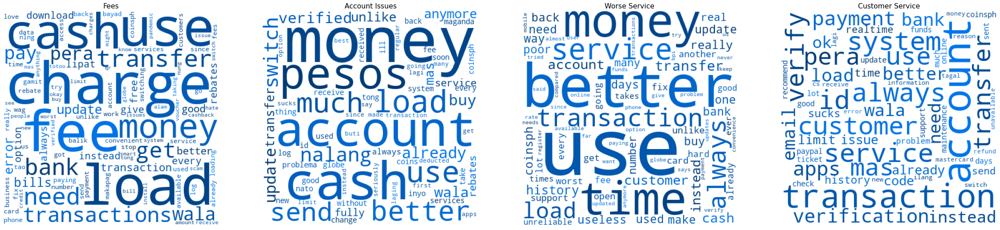

In [78]:
gcash_bad_compare_topics = ['Fees', 'Account Issues', 'Worse Service', 'Customer Service']
topic_wordcloud(gcash_bad_final, 'GCash Bad Reviews', gcash_bad_compare_topics)

In [65]:
paymaya_good_visual = gensimvis.prepare(paymaya_good_final, paymaya_good_reviews_corpus, paymaya_good_reviews_dict)
print(paymaya_good_final.print_topics())
paymaya_good_visual

[(0, '0.145*"mas" + 0.092*"maganda" + 0.075*"use" + 0.060*"thanks" + 0.056*"money" + 0.055*"fee" + 0.052*"cashback" + 0.047*"transfer" + 0.046*"madali" + 0.046*"wala"'), (1, '0.103*"cash" + 0.082*"good" + 0.058*"send" + 0.054*"back" + 0.053*"money" + 0.046*"amount" + 0.044*"credit" + 0.040*"option" + 0.036*"account" + 0.036*"hope"'), (2, '0.075*"easy" + 0.058*"card" + 0.056*"use" + 0.043*"pay" + 0.032*"coins" + 0.031*"transactions" + 0.031*"account" + 0.031*"convenient" + 0.031*"unlike" + 0.031*"money"'), (3, '0.328*"better" + 0.076*"load" + 0.069*"great" + 0.059*"charge" + 0.042*"nice" + 0.034*"much" + 0.027*"paypal" + 0.027*"without" + 0.027*"apps" + 0.026*"dont"')]


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
2     -0.076584 -0.062813       1        1  36.265596
1     -0.201512 -0.060683       2        1  24.597590
3      0.224918 -0.137453       3        1  19.994488
0      0.053179  0.260949       4        1  19.142325, topic_info=           Term       Freq      Total Category  logprob  loglift
6        better  48.000000  48.000000  Default  30.0000  30.0000
30          mas  25.000000  25.000000  Default  29.0000  29.0000
35      maganda  12.000000  12.000000  Default  28.0000  28.0000
43         easy  18.000000  18.000000  Default  27.0000  27.0000
36         good  16.000000  16.000000  Default  26.0000  26.0000
..          ...        ...        ...      ...      ...      ...
51  transaction   1.121494   8.940980   Topic4  -4.7702  -0.4227
31        since   1.083188   9.044148   Topic4  -4.8050  -0.4689
19         nice   1.049460   9.787281   Topic4  -4.8366  -0.5795
26         apps   1.035165  13.871879   Topic4  -4.8503  -0.9420
0       account   1.056453  15.087020   Topic4  -4.8300  -1.0056

[162 rows x 6 columns], token_table=      Topic      Freq     Term
term                          
0         1  0.530257  account
0         2  0.397693  account
0         4  0.066282  account
21        1  0.666594      add
21        2  0.222198      add
...     ...       ...      ...
16        3  0.166277   wallet
16        4  0.332554   wallet
8         1  0.125913  without
8         3  0.503651  without
8         4  0.377738  without

[154 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[3, 2, 4, 1])

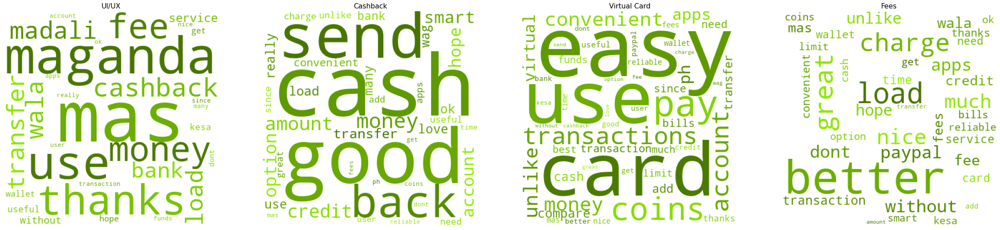

In [75]:
paymaya_good_compare_topics = ['UI/UX', 'Cashback', 'Virtual Card', 'Fees']
topic_wordcloud(paymaya_good_final, 'PayMaya Good Reviews', paymaya_good_compare_topics)

In [67]:
paymaya_bad_visual = gensimvis.prepare(paymaya_bad_final, paymaya_bad_reviews_corpus, paymaya_bad_reviews_dict)
print(paymaya_bad_final.print_topics())
paymaya_bad_visual

[(0, '0.067*"account" + 0.023*"number" + 0.020*"transfer" + 0.019*"already" + 0.019*"email" + 0.018*"use" + 0.018*"update" + 0.017*"fee" + 0.016*"verified" + 0.015*"always"'), (1, '0.052*"upgrade" + 0.046*"account" + 0.044*"id" + 0.039*"use" + 0.039*"better" + 0.025*"wala" + 0.023*"service" + 0.023*"customer" + 0.019*"pera" + 0.017*"time"'), (2, '0.069*"money" + 0.047*"load" + 0.032*"use" + 0.031*"card" + 0.030*"cash" + 0.028*"transfer" + 0.024*"account" + 0.017*"bank" + 0.016*"cant" + 0.016*"ca"')]


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
1      0.129438 -0.084622       1        1  34.872320
2     -0.141087 -0.065260       2        1  33.193747
0      0.011649  0.149882       3        1  31.933933, topic_info=        Term       Freq      Total Category  logprob  loglift
18      load  53.000000  53.000000  Default  30.0000  30.0000
35        id  54.000000  54.000000  Default  29.0000  29.0000
11     money  97.000000  97.000000  Default  28.0000  28.0000
55   upgrade  71.000000  71.000000  Default  27.0000  27.0000
134   better  51.000000  51.000000  Default  26.0000  26.0000
..       ...        ...        ...      ...      ...      ...
11     money  10.745334  97.917914   Topic3  -4.5593  -1.0682
116  anymore   8.540806  19.090351   Topic3  -4.7889   0.3372
145       ca   9.100741  35.963613   Topic3  -4.7254  -0.2327
100     bank   8.550264  27.116255   Topic3  -4.7878  -0.0127
92    unlike   8.547834  27.972221   Topic3  -4.7881  -0.0440

[183 rows x 6 columns], token_table=      Topic      Freq     Term
term                          
193       2  0.994222   access
5         1  0.349386  account
5         2  0.178118  account
5         3  0.472699  account
144       3  0.985281     acct
...     ...       ...      ...
156       2  0.995707    waste
84        3  0.985242  working
136       1  0.308187    worst
136       2  0.539327    worst
136       3  0.192617    worst

[279 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[2, 3, 1])

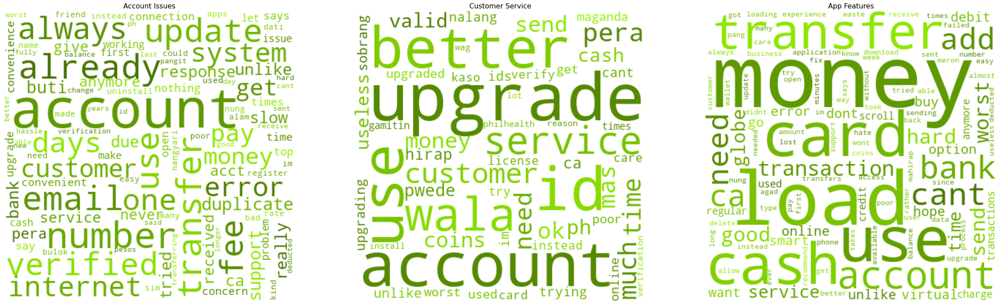

In [80]:
paymaya_bad_compare_topics = ['Account Issues', 'Customer Service', 'App Features']
topic_wordcloud(paymaya_bad_final, 'PayMaya Bad Reviews', paymaya_bad_compare_topics)